# Parallax Pipeline: No-Credentials Demo

This demo notebook runs the pipeline against pre-supplied masks, image chips and ads-b records. The purpose of this notebook is that users without GEE or OpenSky Network credentials can test the core functionality of the pipeline and inspect intermediary results. The pipeline  stages are adjusted accordingly:

0. **Preparation**:
AOI and date range skipped (predetermined for demo)

1. **Candidate Screening**  
Skipped since masks are already downloaded and stored under `demo/step1_masks`

2. **Candidate Filtering** 
All local filter steps run live on pre-supplied masks

3. **Chip Download** 
Skipped since image chips have been downloaded and stored under `demo/step3_chips`

4. **Aircraft Confirmation** 
All verification steps run live on pre-downloaded image chips

4. **ADS-B Cross-Reference** 
ADS-B cross-reference is not included in this demo

See `01_pipeline_run.ipynb` for the fully credentialed run and detailed explanations on all pipeline steps.

In [ ]:
#imports and global settings
import sys
sys.path.append('../src')

from pipeline.pipeline import Pipeline
from pipeline.utils import io
from pipeline.s2_filter import transform, cluster_filter, road_filter, seamline_filter
from pipeline.s3_download import chip_download
from pipeline.s4_confirmation import reflectance_check, collinearity_check, displacement_check, visualise_confirmation

In [3]:
#directory for pre-downloaded files 
DEMO_MASK_DIR = "../data/demo/step1_masks"

# Step 0: Preparation

### Pre-defined AOI via Sentinel-2 Image Tile

In [3]:
# Parameters used for querying tiles from Google Earth Engine
start_date = '2025-10-01' #Format: 'YYYY-MM-DD'
end_date = '2025-10-31' 
tile_name = '11SPT'

## Step 1: Candidate Screening

In [4]:
# Masks pre-downloaded and stored under data/demo/step1_masks (see README's Demo mode section) 
# start_demo_run() derives the AOI bbox from the masks themselves, no GEE call needed.

pipeline = Pipeline()

run_id = pipeline.start_demo_run(
    mask_dir=DEMO_MASK_DIR, 
    start_date=start_date, end_date=end_date, tile_name=tile_name,
)
print(f"demo run_id={run_id}")

demo run_id=2


## Step 2
### 2a. Transformation

In [14]:
candidate_centroids = transform.run_transformation(run_id, DEMO_MASK_DIR)

20251001_T11SPT: 46 candidate pixels → 12 candidate centroids
20251006_T11SPT: 93 candidate pixels → 16 candidate centroids
20251011_T11SPT: 729 candidate pixels → 204 candidate centroids
20251016_T11SPT: 43 candidate pixels → 19 candidate centroids
20251018_T11SPT: 27 candidate pixels → 14 candidate centroids
20251026_T11SPT: 112 candidate pixels → 13 candidate centroids
20251031_T11SPT: 20 candidate pixels → 9 candidate centroids
Inserted into candidate table (run_id=2)

Total candidates across all images: 287 candidate centroids


#### Visual Inspection of Transformation Step

In [14]:
#Define date + tile to inspect inspect individual binary mask
date = '20251011' #format: '20190410'
tile = 'T11SPT' #format: 'T50TMK'

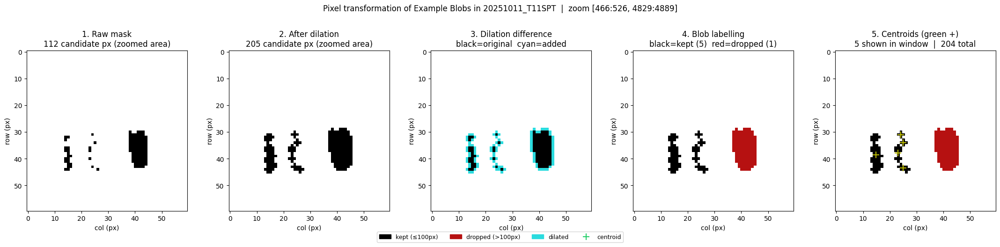

In [15]:
#Inspection of pixel transformation (zoomed)
zoom = 30
transform.inspect_transformation(run_id, date, tile, zoom, mask_dir=DEMO_MASK_DIR)

Transformation Inspection
File                         : 20251011_T11SPT_candidates.tif
Candidate px before dilation : 729
Candidate px after dilation  : 2381
Pixels added by dilation     : 1652
Total blobs found            : 205
Kept (≤100px)                : 204
Dropped (>100px)             : 1
Largest dropped              : 123 px
Largest kept                 : 49 px
Smallest kept                : 5 px


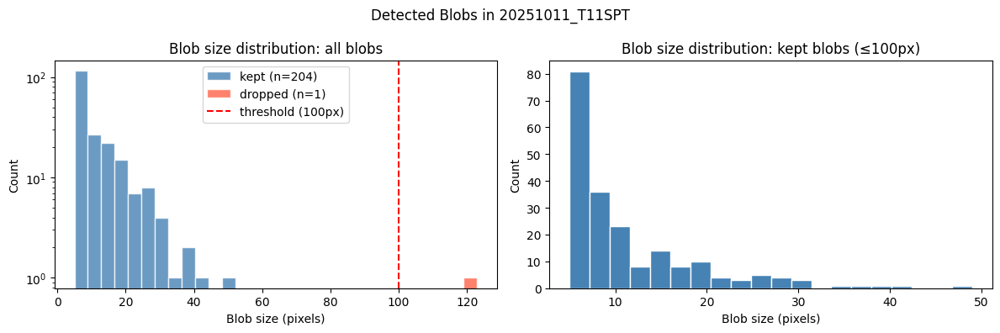

In [16]:
#Inspection of blob size distribution in selected mask
transform.inspect_blobs(run_id, date, tile, mask_dir=DEMO_MASK_DIR)

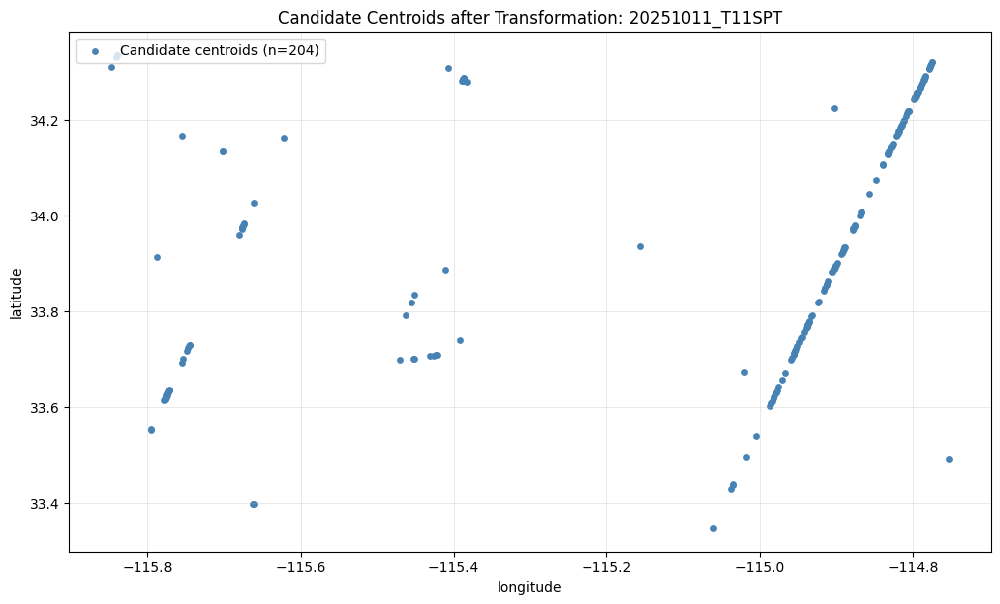

In [17]:
#Inspection of spatial distribution of selected mask
transform.blob_centr_plot(run_id, date, tile)

### 2b. Cluster Exclusion

In [15]:
df_cluster_filtered = cluster_filter.run_cluster_exclusion(run_id, candidate_centroids)

Total candidates before cluster filter: 287

20251001_T11SPT:
  candidates before : 12
  candidates after  : 12
  excluded          : 0
  min distance      : 180.3 m
  max distance      : 24068.1 m
20251001_T11SPT: 12 → 12

20251006_T11SPT:
  candidates before : 16
  candidates after  : 11
  excluded          : 5
  min distance      : 101.8 m
  max distance      : 46463.3 m
20251006_T11SPT: 16 → 11

20251011_T11SPT:
  candidates before : 204
  candidates after  : 43
  excluded          : 161
  min distance      : 31.7 m
  max distance      : 23990.5 m
20251011_T11SPT: 204 → 43

20251016_T11SPT:
  candidates before : 19
  candidates after  : 14
  excluded          : 5
  min distance      : 61.4 m
  max distance      : 45632.1 m
20251016_T11SPT: 19 → 14

20251018_T11SPT:
  candidates before : 14
  candidates after  : 14
  excluded          : 0
  min distance      : 110.2 m
  max distance      : 34625.7 m
20251018_T11SPT: 14 → 14

20251026_T11SPT:
  candidates before : 13
  candidates aft

#### Visual Inspection of Cluster Filter

Cluster Filter Inspection
Before:     204 centroids
Survivors:  43 centroids
Removed:    161 centroids


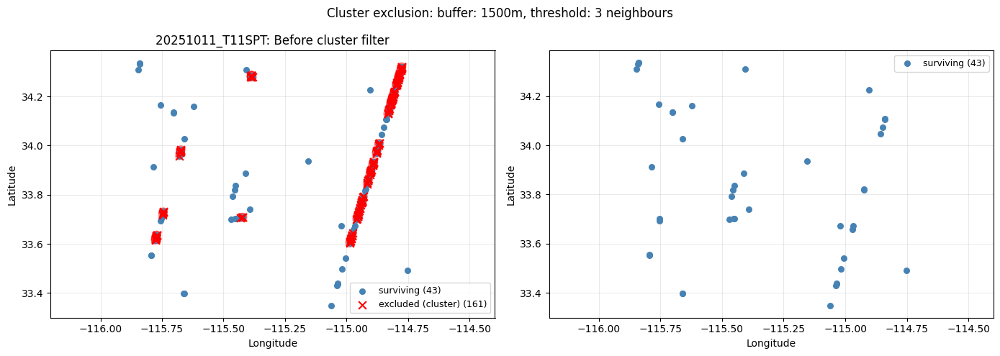

In [19]:
#Exemplary inspection of cluster exclusion in selected mask:
date = '20251011' #format: '20190410'
tile = 'T11SPT' #format: 'T50TMK'

cluster_filter.cluster_filtered_plot(run_id, date, tile, mask_dir=DEMO_MASK_DIR)

### Step 2c: Road Exclusion

In [16]:
df_road_filtered = road_filter.run_road_exclusion(run_id, df_cluster_filtered, mask_dir=DEMO_MASK_DIR)

Processing tile T11SPT: 116 candidates across 7 dates
  → frequency image saved: <repo-root>/data/runs/run_2/step2_road_frequency/T11SPT_frequency.npy
  → excluded 0 / 116, kept 116

Updated road_score/road_excluded for 116 candidate(s) in the database


#### Visual Inspection of Road Filter

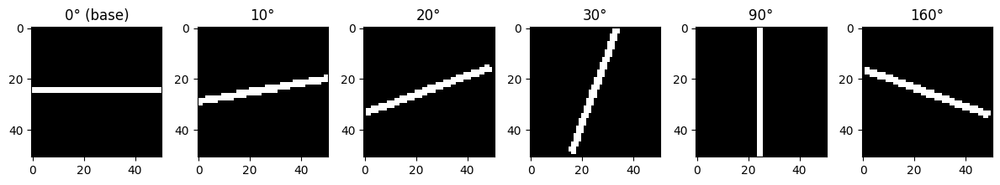

In [21]:
#Inspecting kernel rotations
#Defining angles for inspection 
a_1 = 10
a_2 = 20
a_3 = 70
a_4 = 90
a_5 = 160

road_filter.kernel_viz(a_1, a_2, a_3, a_4, a_5)

Frequency Image Inspection
Frequency image            : T11SPT_frequency.npy
Shape                      : (10981, 10982)
Dates Captured             : 7
Non-zero pixels            : 115
Unique centroid positions  : 115
In freq not in centroids   : 0
In centroids not in freq   : 0
Highlight date 20251011: 43 candidates


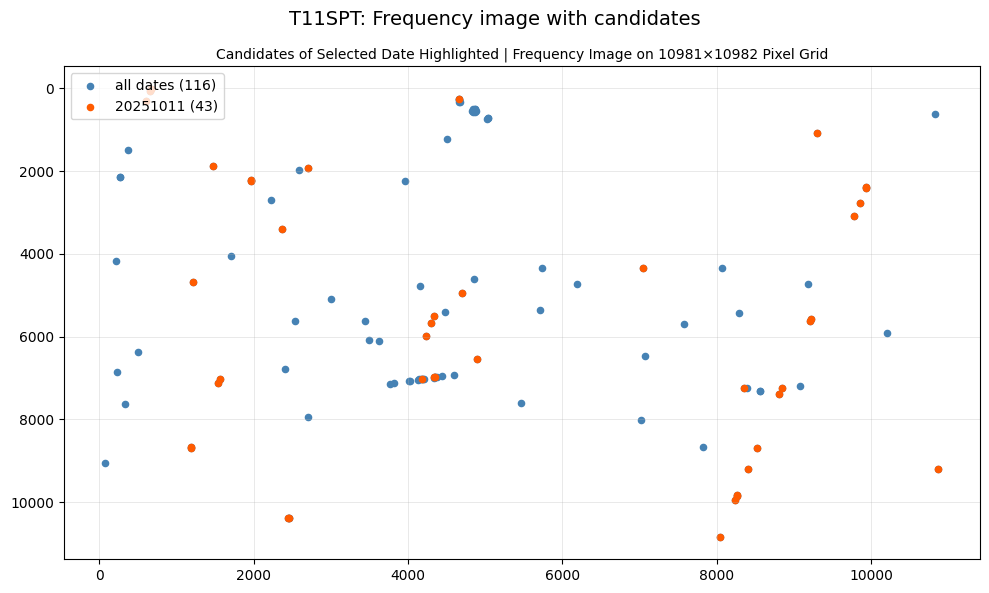

In [22]:
#Define highlight date and tile for inspection of frequency image
highlight_date = '20251011'
tile = 'T11SPT' #format: 'T50TMK'

road_filter.freq_image_plot(run_id, tile, highlight_date)

Road Filter Inspection
Before:     116 centroids
Survivors:  116 centroids
Removed:    0 centroids


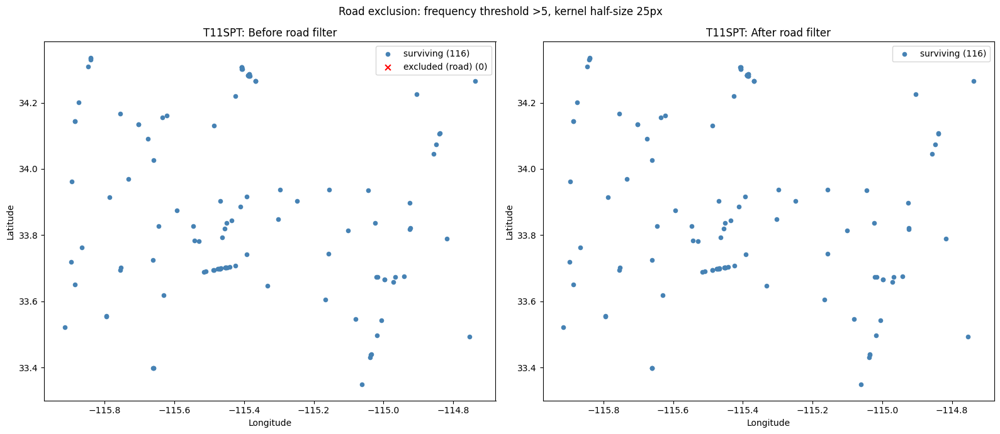

In [23]:
#inspecting road filter on selected frequency image (i.e. tile)
road_filter.road_filtered_plot(run_id, tile)

### Step 2d: Seam-line Exclusion

In [17]:
df_seam_filtered = seamline_filter.run_seamline_exclusion(run_id, df_road_filtered)


20251001_T11SPT: 12 candidates
iteration 1: best line 108.0°  inliers=3  seam=False
not a seam-line direction, stopping
0 candidates removed
12 candidates → 12 candidates

20251006_T11SPT: 11 candidates
iteration 1: best line 15.4°  inliers=4  seam=False
not a seam-line direction, stopping
0 candidates removed
11 candidates → 11 candidates

20251011_T11SPT: 43 candidates
iteration 1: best line 77.3°  inliers=14  seam=True
iteration 2: best line 77.4°  inliers=6  seam=True
iteration 3: best line 77.4°  inliers=4  seam=True
iteration 4: best line 93.4°  inliers=3  seam=False
not a seam-line direction, stopping
24 candidates removed
43 candidates → 19 candidates

20251016_T11SPT: 14 candidates
iteration 1: best line 60.7°  inliers=4  seam=False
not a seam-line direction, stopping
0 candidates removed
14 candidates → 14 candidates

20251018_T11SPT: 14 candidates
iteration 1: best line 14.8°  inliers=4  seam=False
not a seam-line direction, stopping
0 candidates removed
14 candidates → 14 

#### Visual Inspection of Seam-Line Filter

Plot line angle: 77.3°


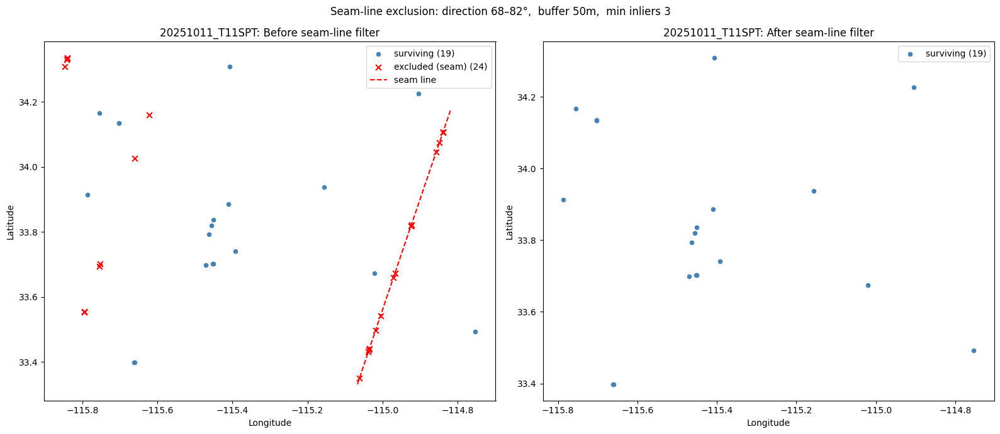

In [25]:
#Inspection of seam line filter on selected mask
date = '20251011' #format: '20190410'
tile = 'T11SPT' #format: 'T50TMK'

seamline_filter.plot_seamline_exclusion(run_id, date, tile)

## Step 3: Image Chip Download

In [19]:
# Step 3
# Seeding chip table with pre-downloaded image chips for no-credential demo run
from pipeline.utils.demo_seed import seed_chip_cache
seed_chip_cache()

df_confirmed_chips = chip_download.run_chip_download(run_id, df_seam_filtered)

Seeded 92 chip cache entries from ../data/demo/step3_chip_cache
Surviving candidates: 92

20251001_T11SPT: 12 candidates
  → downloaded 0, from cache 12, failed 0

20251006_T11SPT: 11 candidates
  → downloaded 0, from cache 11, failed 0

20251011_T11SPT: 19 candidates
  → downloaded 0, from cache 19, failed 0

20251016_T11SPT: 14 candidates
  → downloaded 0, from cache 14, failed 0

20251018_T11SPT: 14 candidates
  → downloaded 0, from cache 14, failed 0

20251026_T11SPT: 13 candidates
  → downloaded 0, from cache 13, failed 0

20251031_T11SPT: 9 candidates
  → downloaded 0, from cache 9, failed 0

── chip download summary ──
scene                      total downloaded   cached   failed
────────────────────────────────────────────────────────────
20251001_T11SPT               12          0       12        0
20251006_T11SPT               11          0       11        0
20251011_T11SPT               19          0       19        0
20251016_T11SPT               14          0       14     

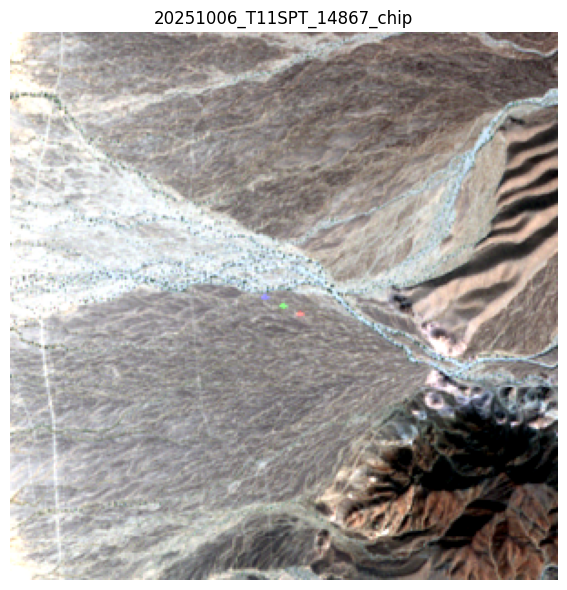

In [ ]:
#inspecting single image by candidate id
#example of a true aircraft detection

idx = 14867
visualise_confirmation.plot_chip_by_idx(run_id, idx)

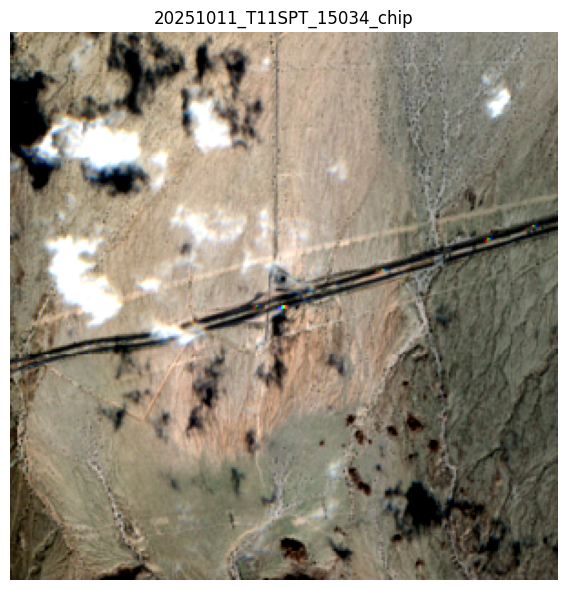

In [66]:
#inspecting single image by id
#example of a false positive 

idx = 15034
visualise_confirmation.plot_chip_by_idx(run_id, idx)

## Step 4: Aircraft Confirmation
### Step 4a: Inter-band Reflectance Anomaly Segmentation

In [20]:
df_reflectance = reflectance_check.run_reflectance_check(run_id, df_seam_filtered)

Running Reflectance Anomaly Check...

Reflectance Segmentation Summary
Total candidates     : 92
Chips found on disk  : 92
Chips missing        : 0
B3 anomaly found     : 92
B3 anomaly missing   : 0  ← chip drops out of pipeline
Total centroids      : 644
  B2 centroids       : 276
  B3 centroids       : 92
  B4 centroids       : 276


#### Visual Inspection of Reflectance Anomaly Check

In [41]:
idx = 14867
chip, chip_path = io.load_chip_by_idx(run_id, idx)

B2 mean: 1533.9  max: 2709.0
B3 mean: 1459.9  max: 2552.0
B4 mean: 1599.2  max: 2895.0


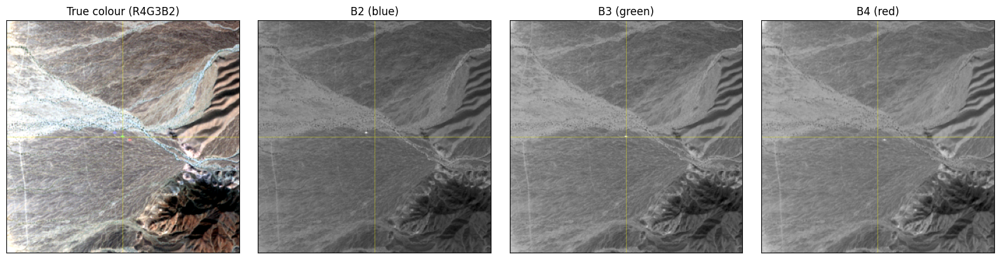

In [44]:
visualise_confirmation.plot_4B_chip(chip)

B2 - B3: max=1207.0 at row=145, col=139
B2 - B4: max=1066.0 at row=145, col=139
B3 - B2: max=1017.0 at row=150, col=149
B3 - B4: max=957.0 at row=150, col=149
B4 - B2: max=979.0 at row=154, col=158
B4 - B3: max=995.0 at row=154, col=158


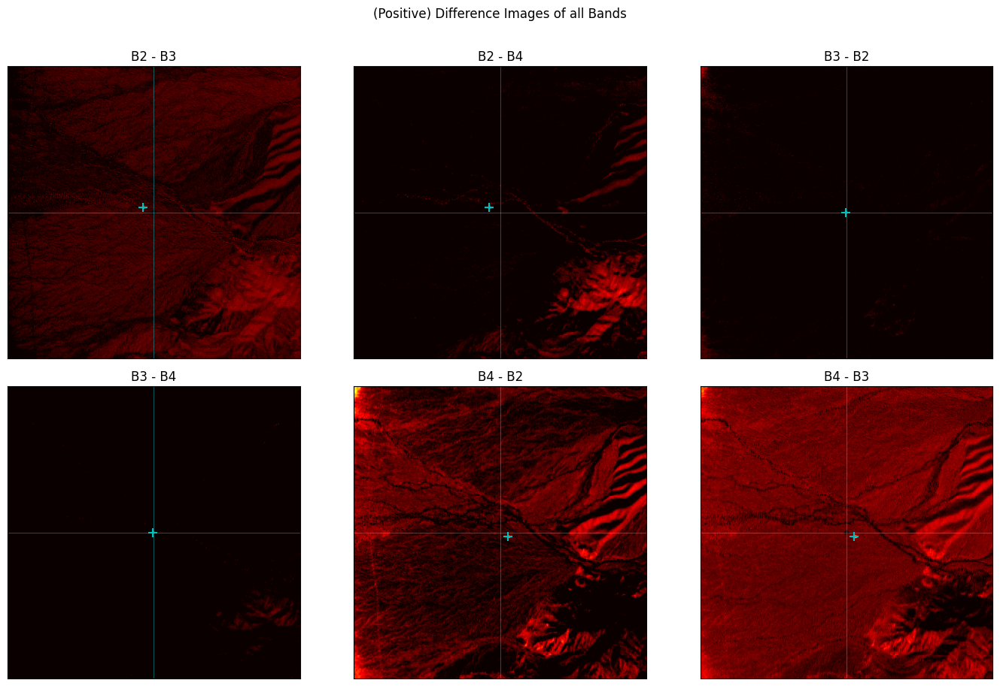

In [45]:
#Inspection of brightest anomalies in difference images
visualise_confirmation.plot_difference_images(chip)

Anomaly pixels:
  B2: 429 px  / 3 components
  B3: 128 px  / 1 components
  B4: 579 px  / 3 components


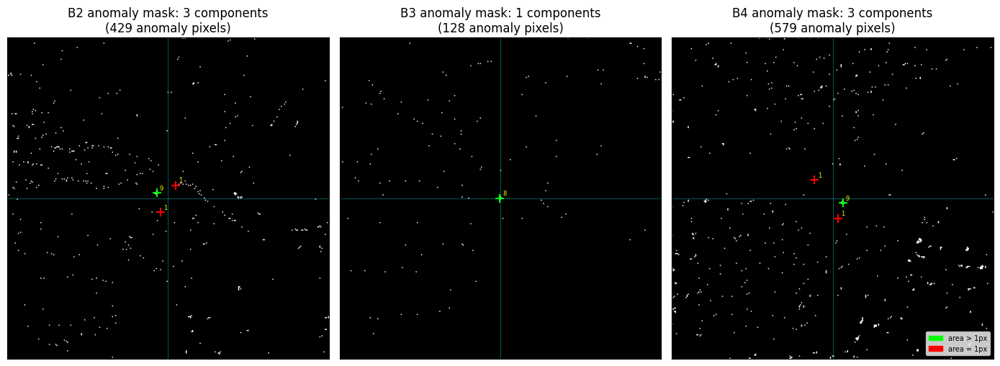

In [46]:
visualise_confirmation.plot_anomaly_masks(chip)

### Step 4b: Collinearity Check

In [21]:
df_collinearity = collinearity_check.run_collinearity_check(run_id, df_reflectance)


Collinearity Check Summary
Total chips          : 92
With colinear combos : 54
No colinear combos   : 38
Total combinations   : 828
Passing combos       : 85
Non-passing combos   : 743

Per-tile breakdown:
        chips  colinear
tile                   
T11SPT     92        85


#### Visual Inspection of Collinearity Check

Total combinations      : 828
Passing (≥170°)         : 85
Failing (<170°)         : 743


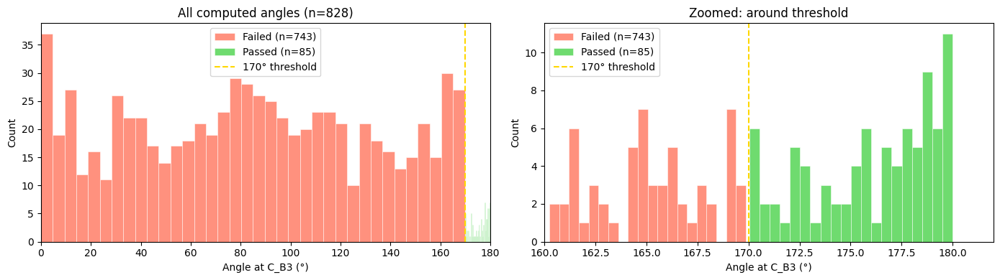

In [22]:
visualise_confirmation.passing_angle_scatter(run_id)


idx=14867  20251006_T11SPT_14867_chip.tif
  Passing combinations : 1
  combo 1: angle=177.9°  B2=(139.3, 145.1)  B3=(149.5, 150.0)  B4=(159.4, 154.3)


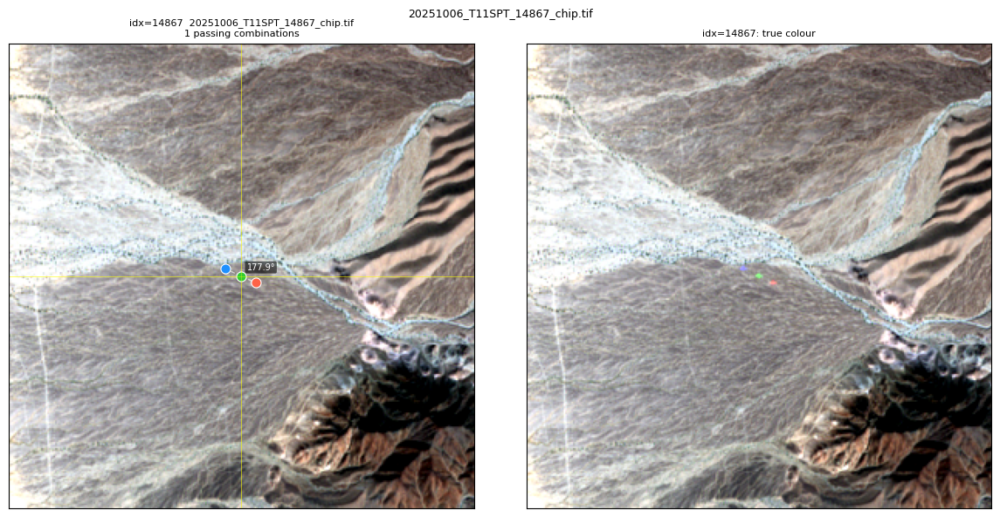

In [47]:
idx = 14867
visualise_confirmation.plot_collinearity(run_id, idx)

### Step 4c: Proportional Displacement Check

In [25]:
df_confirmed = displacement_check.run_displacement_check(run_id, df_collinearity)


Displacement Check Summary
Downloaded chips            : 92
Chips with collinear combos : 54
→ Confirmed                 : 40
→ Rejected by displacement  : 14
Confirmed / downloaded chips: 43.5%

Per-tile breakdown:
        candidates  confirmed  rate_pct
tile                                   
T11SPT          92         40      43.5

Speed (confirmed aircraft):
  mean   : 704 km/h
  median : 776 km/h
  min    : 113 km/h
  max    : 1166 km/h


#### Full Visual Inspection of a Unique Chip
##### Example 1: Confirmed Aircraft

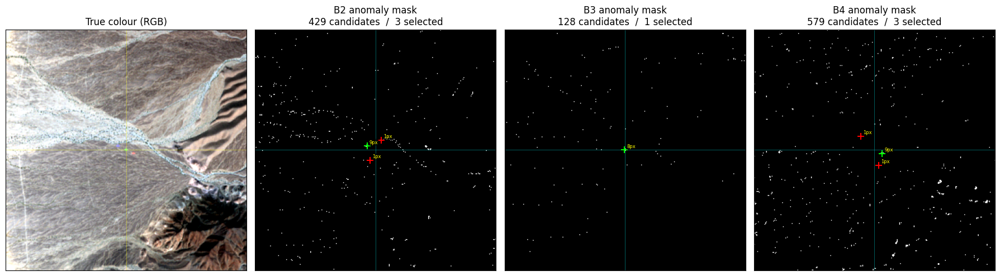

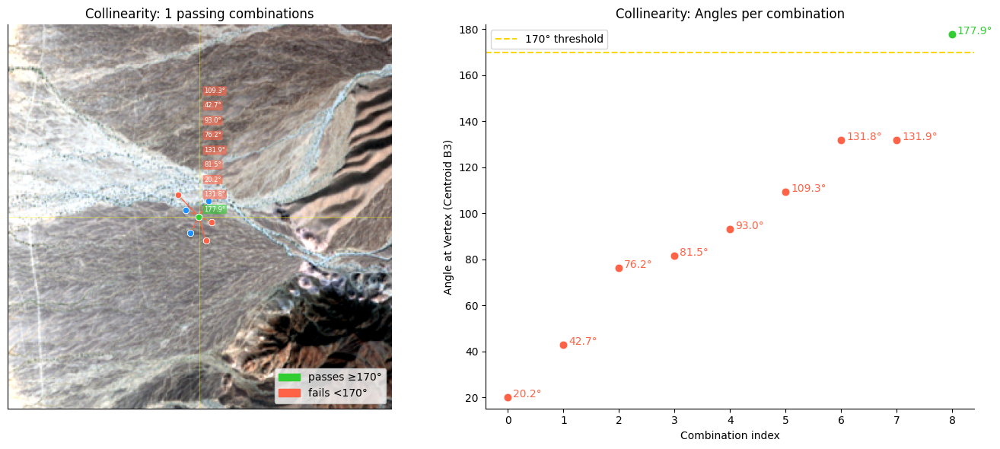

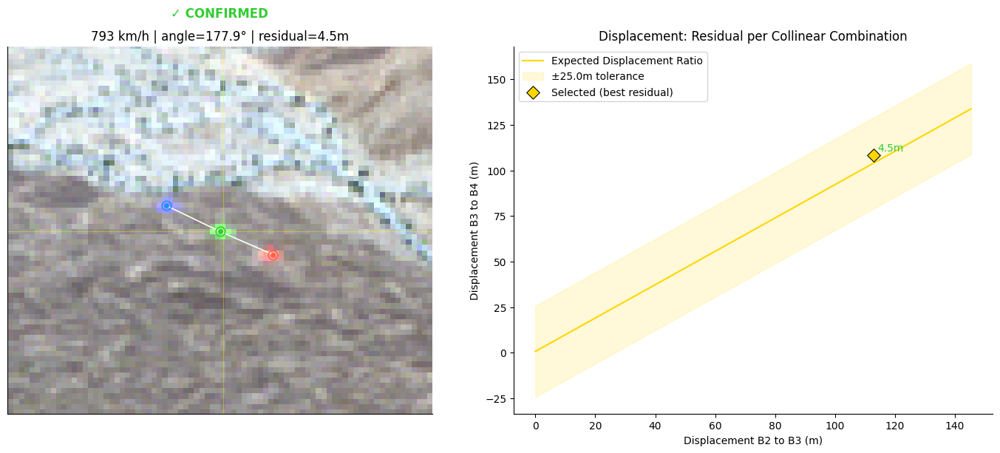

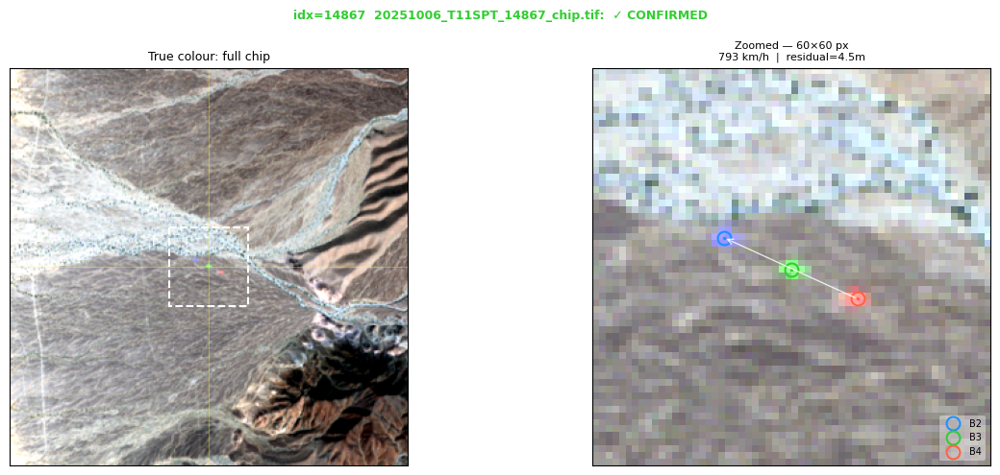

In [ ]:
# Inspect any chip by index. 
# Check table `confirmed_detection`: All confirmed/rejected detections are stored here with a `candidate_id` and `confirmed` flag.

idx = 14867

visualise_confirmation.plot_chip_reflectance(run_id, idx)
visualise_confirmation.plot_chip_collinearity(run_id, idx)
visualise_confirmation.plot_chip_displacement(run_id, idx)
visualise_confirmation.plot_chip_confirmation(run_id, idx)

##### Example 2: Rejected Detection due to Collinearity Constraint

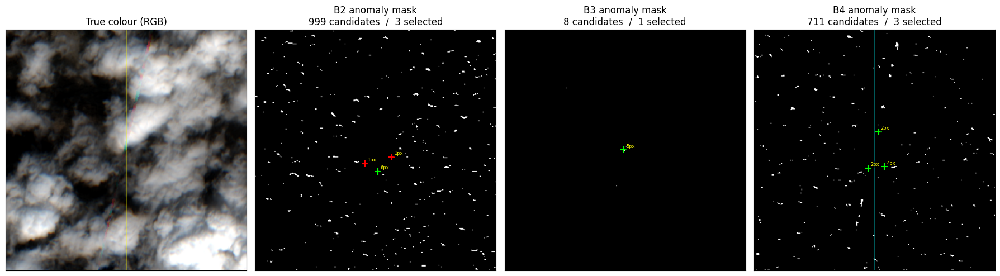

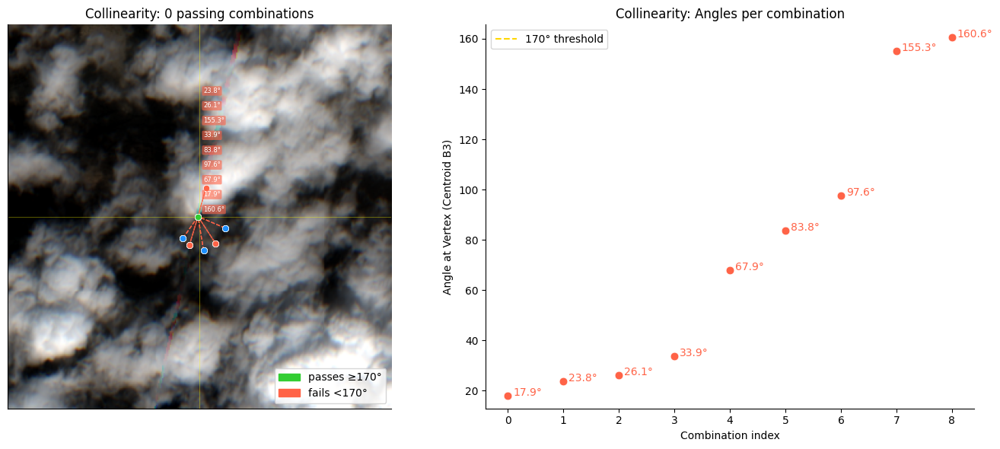

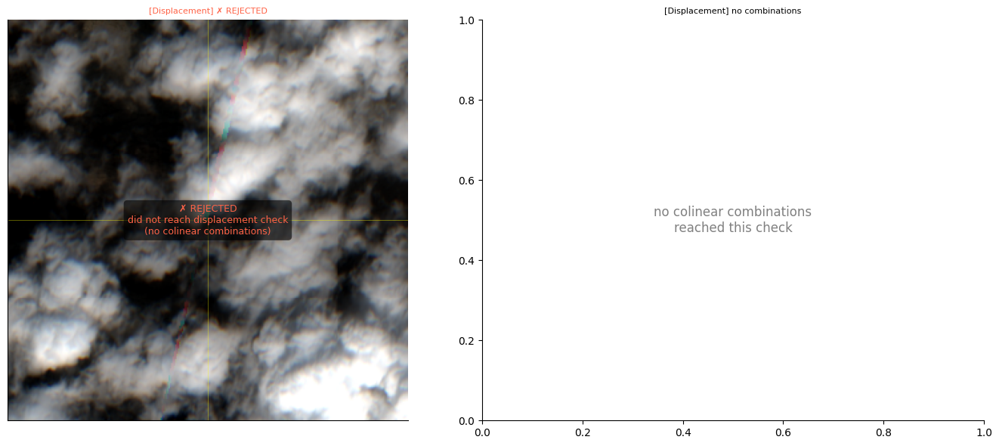

idx=14997 is not a confirmed detection: skipping


In [63]:
idx = 14997

visualise_confirmation.plot_chip_reflectance(run_id, idx)
visualise_confirmation.plot_chip_collinearity(run_id, idx)
visualise_confirmation.plot_chip_displacement(run_id, idx)
visualise_confirmation.plot_chip_confirmation(run_id, idx)

##### Example 3: Rejected Detection due to Displacement Constraint

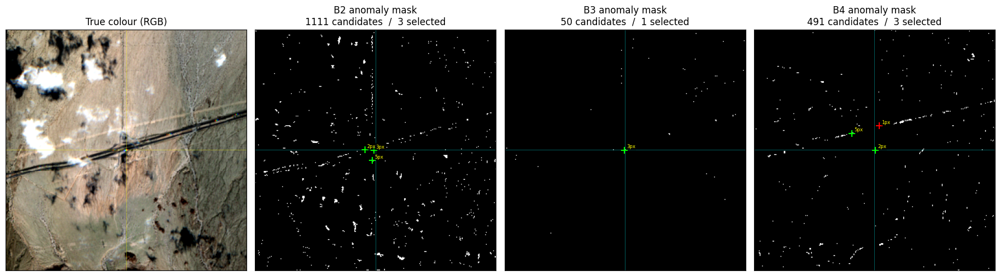

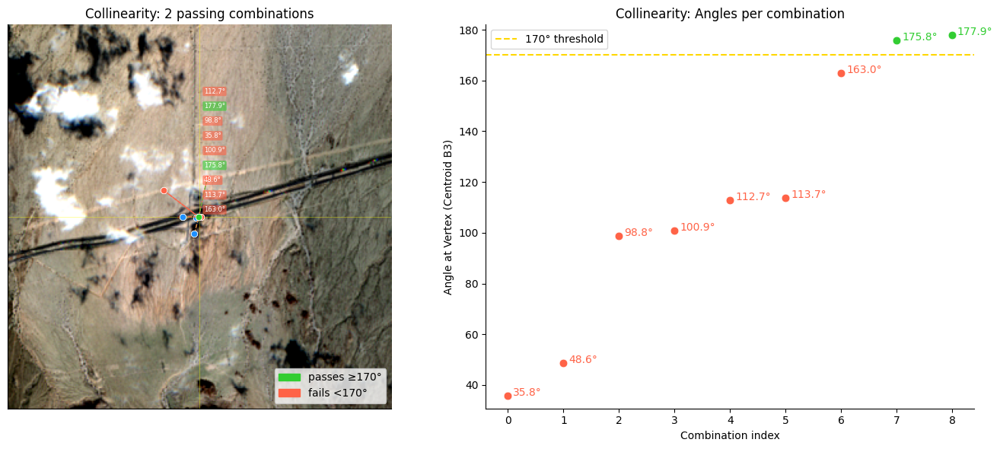

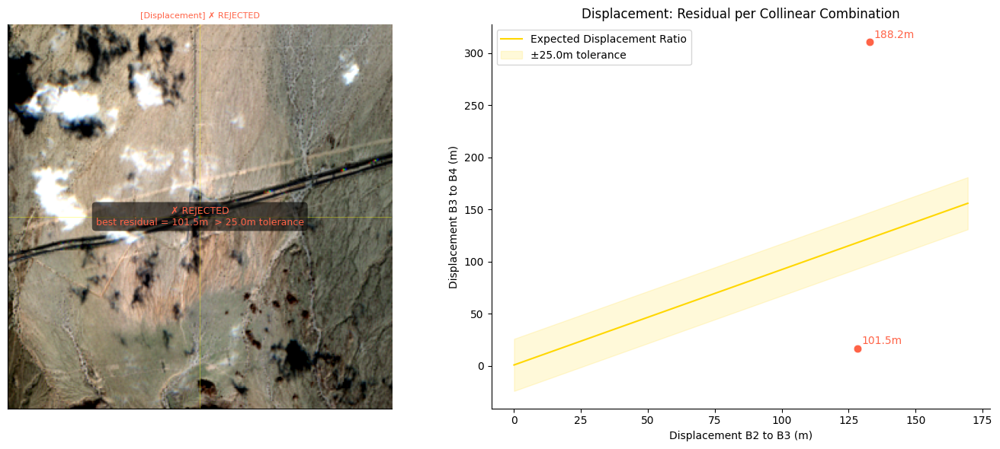

idx=15034 is not a confirmed detection: skipping


In [65]:
idx = 15034

visualise_confirmation.plot_chip_reflectance(run_id, idx)
visualise_confirmation.plot_chip_collinearity(run_id, idx)
visualise_confirmation.plot_chip_displacement(run_id, idx)
visualise_confirmation.plot_chip_confirmation(run_id, idx)

##### Pipeline Summary Visualised


STEP 4 PIPELINE SUMMARY
Candidates entering Step 4 : 92
B3 anomaly found           : 92  (100.0%)
Colinear combination found : 54  (58.7%)
Confirmed aircraft         : 40  (43.5%)

Speed stats:
  mean   : 704 km/h
  median : 776 km/h
  min    : 113 km/h
  max    : 1166 km/h


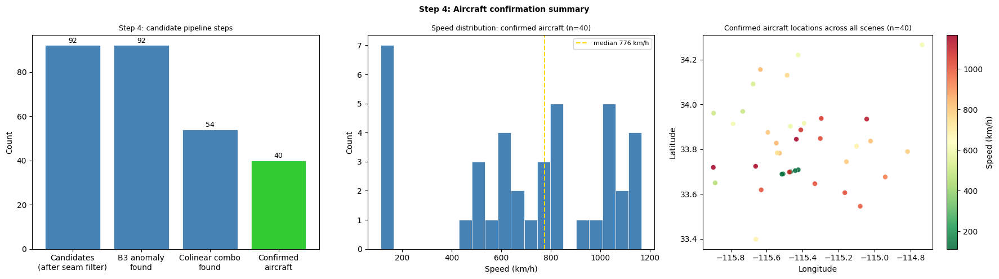

In [49]:
# Full pipeline summary
visualise_confirmation.plot_pipeline_summary(run_id)